<a href="https://colab.research.google.com/github/mia2465/PMLTermProject/blob/main/VAELatentSpaceTesting.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##### Copyright 2020 The TensorFlow Authors.

In [ ]:
#@title Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# Convolutional Variational Autoencoder

<table class="tfo-notebook-buttons" align="left">
  <td>
    <a target="_blank" href="https://www.tensorflow.org/tutorials/generative/cvae">
    <img src="https://www.tensorflow.org/images/tf_logo_32px.png" />
    View on TensorFlow.org</a>
  </td>
  <td>
    <a target="_blank" href="https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/generative/cvae.ipynb">
    <img src="https://www.tensorflow.org/images/colab_logo_32px.png" />
    Run in Google Colab</a>
  </td>
  <td>
    <a target="_blank" href="https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/cvae.ipynb">
    <img src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />
    View source on GitHub</a>
  </td>
  <td>
    <a href="https://storage.googleapis.com/tensorflow_docs/docs/site/en/tutorials/generative/cvae.ipynb"><img src="https://www.tensorflow.org/images/download_logo_32px.png" />Download notebook</a>
  </td>
</table>

This code is largely alterations from TensorFlows official example for VAE's. The links for this official site and lisensing information are shown above this cell.

This VAE variation is specifically for testing which size of latent space results in the most accurate recreation of the origional pictures when put through a VAE.

## Setup

In [ ]:
!pip install tensorflow-probability

# to generate gifs
!pip install imageio
!pip install git+https://github.com/tensorflow/docs
#!pip install pydicom

from google.colab import drive
drive.mount('/content/drive')

from IPython import display

import glob
import imageio
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf
import tensorflow_probability as tfp
import time
import pandas as pd


  Cloning https://github.com/tensorflow/docs to /tmp/pip-req-build-oxuhyax2
  Running command git clone --filter=blob:none --quiet https://github.com/tensorflow/docs /tmp/pip-req-build-oxuhyax2
  Resolved https://github.com/tensorflow/docs to commit 3eac15bae13ea389957e7eb499252ef5da6c9f01
  Preparing metadata (setup.py) ... done
  Created wheel for tensorflow-docs: filename=tensorflow_docs-2024.4.30.68232-py3-none-any.whl size=182538 sha256=f138c180d2da4c374576f02cf6528bc29fa618f3f0f18589769f7a2cb29f8150
  Stored in directory: /tmp/pip-ephem-wheel-cache-8iruwf95/wheels/86/0f/1e/3b62293c8ffd0fd5a49508e6871cdb7554abe9c62afd35ec53
Successfully built tensorflow-docs
Mounted at /content/drive


Required data sets that were created via the preprocessing files in other sections of the repository.

In [ ]:
#This is for the set in which 98% of all the CT scans are used for testing
train_dataset = tf.data.Dataset.load('/content/drive/MyDrive/AllDICOM/trainSet128')

In [ ]:
#This is for the set in which 98% of all the CT scans are used for training
test_dataset = tf.data.Dataset.load('/content/drive/MyDrive/AllDICOM/testSet128')

In [ ]:
# For 98% data set
train_size =  8,718
batch_size = 32
test_size =  178

Requried functions for the VAE to function.

In [ ]:
def generate_and_save_images(model, epoch, test_sample):
  mean, logvar = model.encode(test_sample)
  z = model.reparameterize(mean, logvar)
  predictions = model.sample(z)
  fig = plt.figure(figsize=(4, 4))

  for i in range(predictions.shape[0]):
    plt.subplot(4, 4, i + 1)
    plt.imshow(predictions[i, :, :, 0], cmap='gray')
    plt.axis('off')

  # tight_layout minimizes the overlap between 2 sub-plots
  plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
  plt.show()

In [ ]:
# Pick a sample of the test set for generating output images
assert batch_size >= num_examples_to_generate
for test_batch in test_dataset.take(1):
  test_sample = test_batch[0:num_examples_to_generate, :, :, :]

In [ ]:
def display_image(epoch_no):
  return PIL.Image.open('image_at_epoch_{:04d}.png'.format(epoch_no))

The actual running and experimentation of the VAE. The end results from this testing shows the value difference between the normalized pixel values of the origional and the ones ran through the VAE for each latent space.

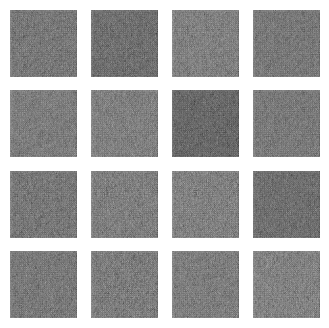

Epoch: 1, Test set ELBO: -7300.39208984375, time elapse for current epoch: 20.44250988960266


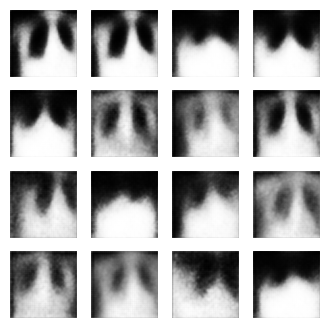

Epoch: 2, Test set ELBO: -6812.943359375, time elapse for current epoch: 6.427885055541992


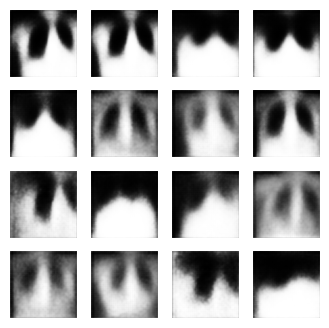

Epoch: 3, Test set ELBO: -6804.33984375, time elapse for current epoch: 6.187344551086426


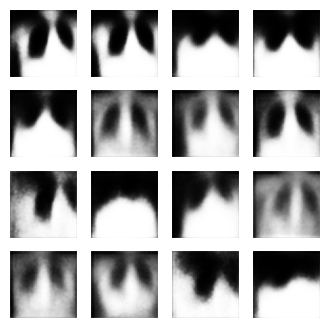

Epoch: 4, Test set ELBO: -6675.501953125, time elapse for current epoch: 6.225085258483887


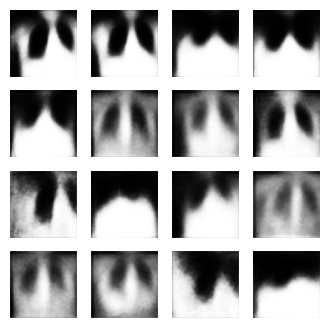

Epoch: 5, Test set ELBO: -6637.23095703125, time elapse for current epoch: 10.246070146560669


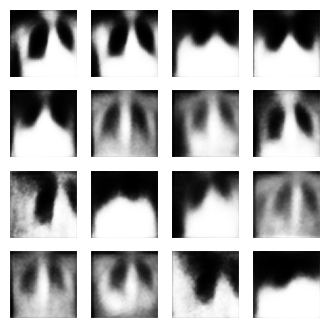

Epoch: 6, Test set ELBO: -6627.89599609375, time elapse for current epoch: 6.184185028076172


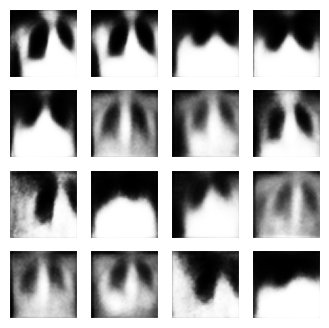

Epoch: 7, Test set ELBO: -6628.98046875, time elapse for current epoch: 6.1910576820373535


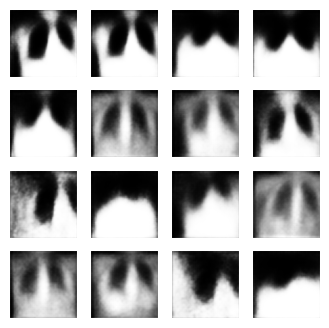

Epoch: 8, Test set ELBO: -6621.41943359375, time elapse for current epoch: 6.16928505897522


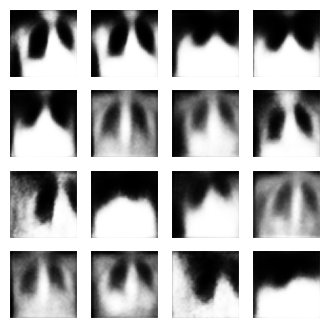

Epoch: 9, Test set ELBO: -6590.79736328125, time elapse for current epoch: 6.2310426235198975


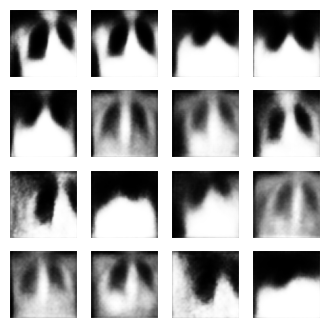

Epoch: 10, Test set ELBO: -6581.54443359375, time elapse for current epoch: 6.277775526046753


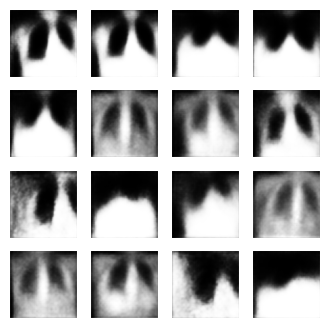

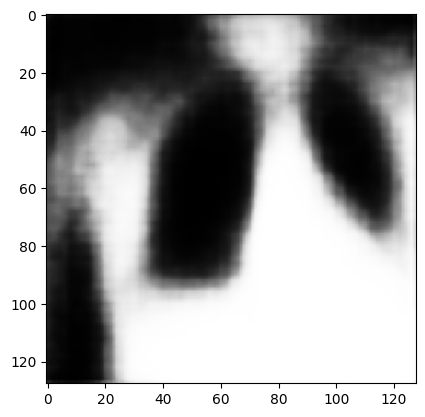

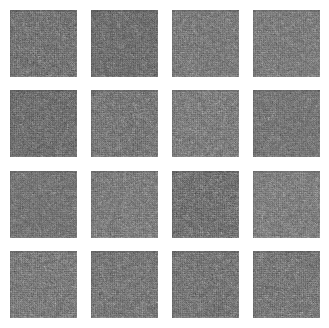

Epoch: 1, Test set ELBO: -7672.16796875, time elapse for current epoch: 10.242355823516846


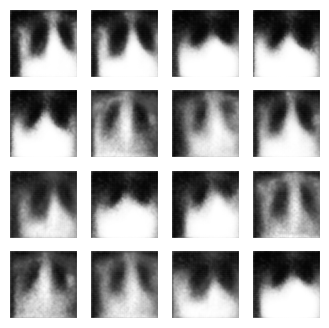

Epoch: 2, Test set ELBO: -6890.61279296875, time elapse for current epoch: 6.294081687927246


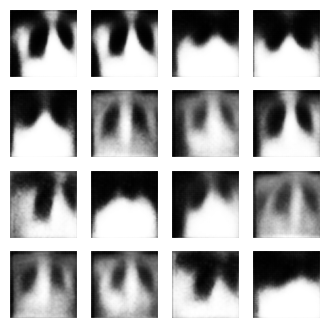

Epoch: 3, Test set ELBO: -6783.98046875, time elapse for current epoch: 6.212911128997803


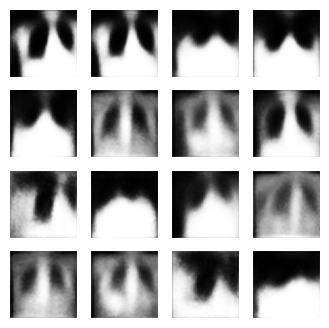

Epoch: 4, Test set ELBO: -6726.81787109375, time elapse for current epoch: 6.227765083312988


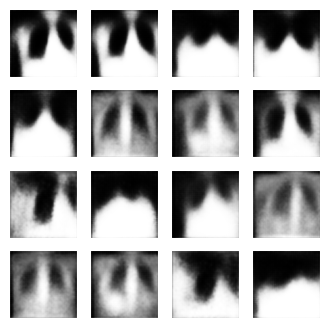

Epoch: 5, Test set ELBO: -6696.25048828125, time elapse for current epoch: 6.251660108566284


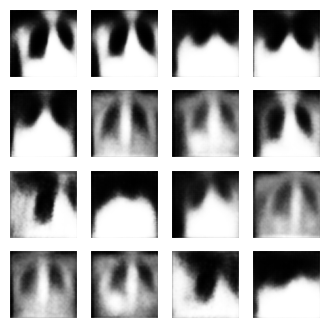

Epoch: 6, Test set ELBO: -6692.07763671875, time elapse for current epoch: 6.259538173675537


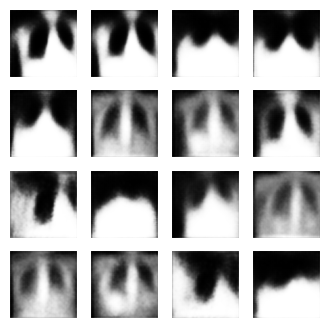

Epoch: 7, Test set ELBO: -6664.203125, time elapse for current epoch: 6.336045503616333


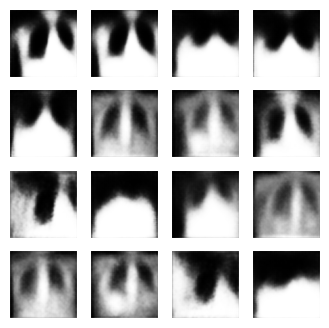

Epoch: 8, Test set ELBO: -6641.92724609375, time elapse for current epoch: 6.300333261489868


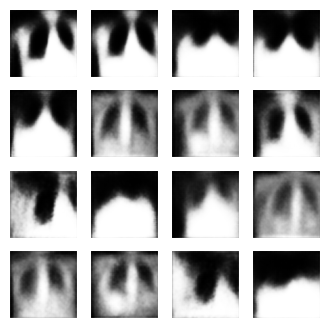

Epoch: 9, Test set ELBO: -6623.77734375, time elapse for current epoch: 6.350895404815674


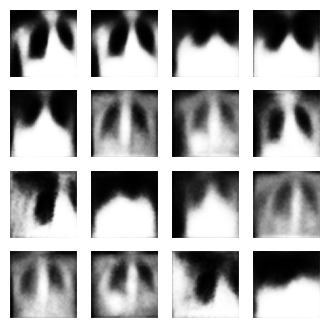

Epoch: 10, Test set ELBO: -6618.064453125, time elapse for current epoch: 6.3140623569488525


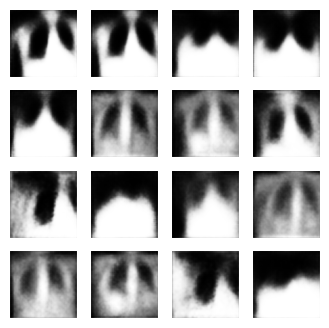

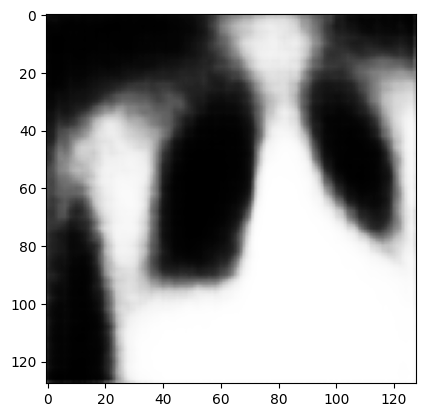

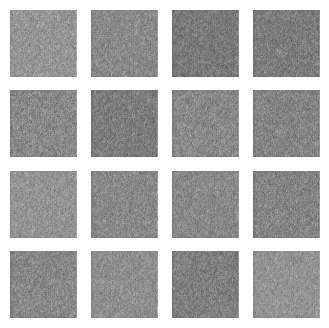

Epoch: 1, Test set ELBO: -7537.73828125, time elapse for current epoch: 8.878724575042725


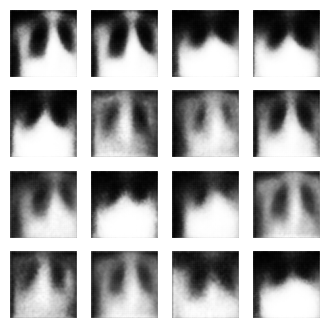

Epoch: 2, Test set ELBO: -6907.76025390625, time elapse for current epoch: 6.425950050354004


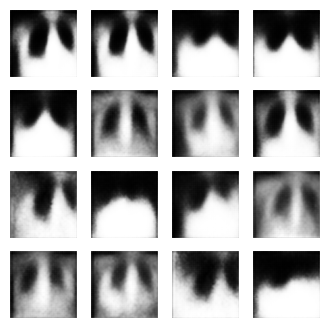

Epoch: 3, Test set ELBO: -6810.02734375, time elapse for current epoch: 6.33307147026062


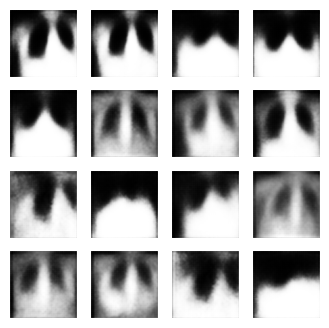

Epoch: 4, Test set ELBO: -6772.45263671875, time elapse for current epoch: 6.682121515274048


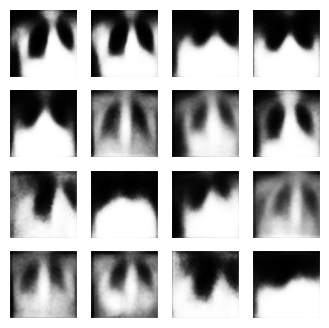

Epoch: 5, Test set ELBO: -6695.73583984375, time elapse for current epoch: 6.343761444091797


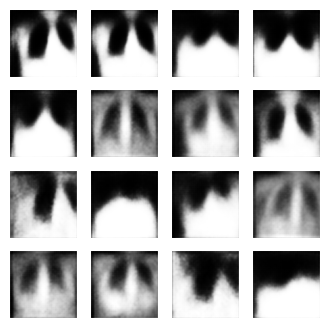

Epoch: 6, Test set ELBO: -6651.962890625, time elapse for current epoch: 6.369750261306763


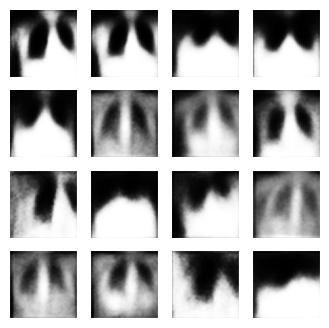

Epoch: 7, Test set ELBO: -6632.99169921875, time elapse for current epoch: 6.391229152679443


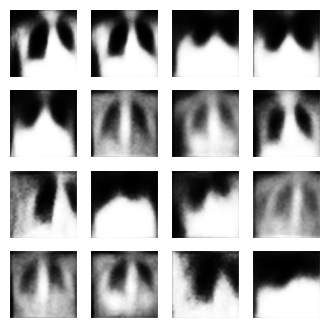

Epoch: 8, Test set ELBO: -6622.13427734375, time elapse for current epoch: 6.374969959259033


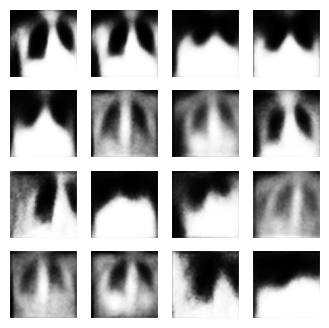

Epoch: 9, Test set ELBO: -6642.55712890625, time elapse for current epoch: 6.38337254524231


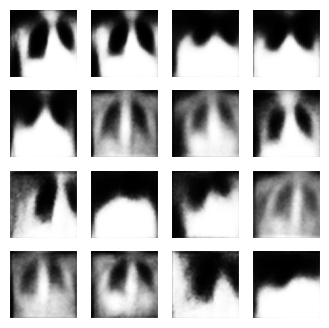

Epoch: 10, Test set ELBO: -6621.46728515625, time elapse for current epoch: 6.392290830612183


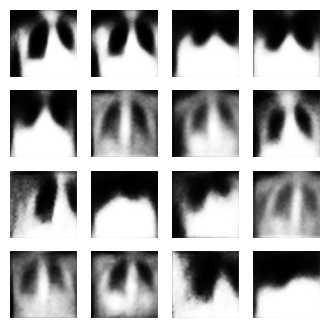

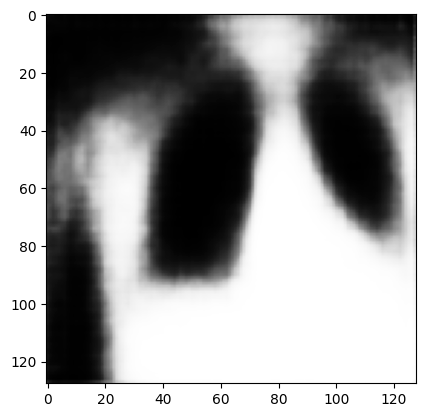

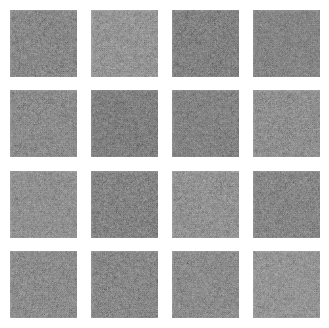

Epoch: 1, Test set ELBO: -7257.57177734375, time elapse for current epoch: 8.793688297271729


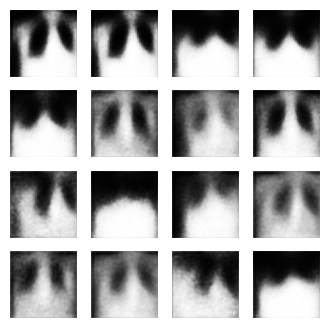

Epoch: 2, Test set ELBO: -6802.53369140625, time elapse for current epoch: 6.367962598800659


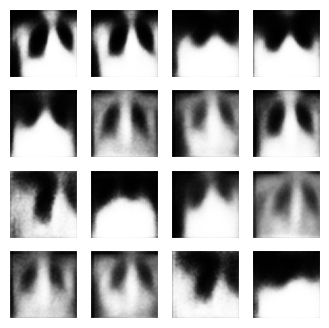

Epoch: 3, Test set ELBO: -6737.94482421875, time elapse for current epoch: 6.373629093170166


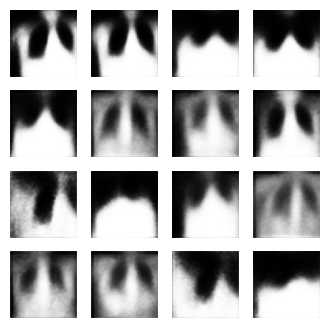

Epoch: 4, Test set ELBO: -6691.287109375, time elapse for current epoch: 6.460942506790161


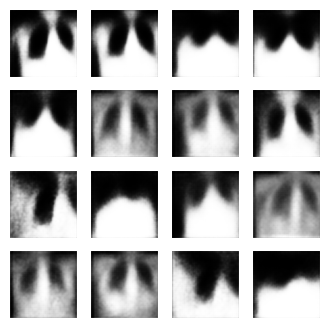

Epoch: 5, Test set ELBO: -6658.28857421875, time elapse for current epoch: 10.240124702453613


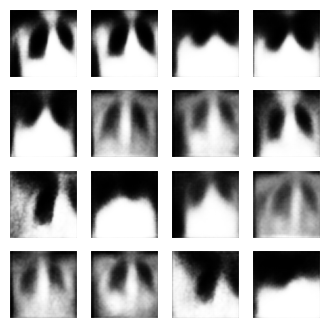

Epoch: 6, Test set ELBO: -6649.50537109375, time elapse for current epoch: 6.393473863601685


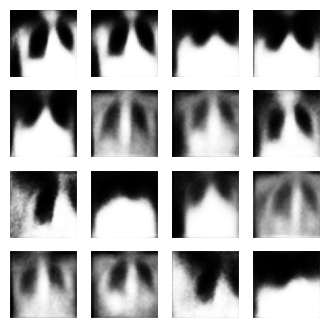

Epoch: 7, Test set ELBO: -6615.78466796875, time elapse for current epoch: 6.451993465423584


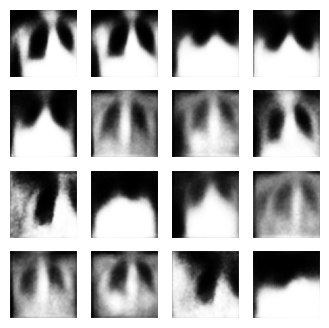

Epoch: 8, Test set ELBO: -6614.31005859375, time elapse for current epoch: 6.3928892612457275


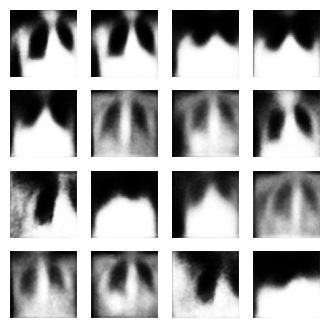

Epoch: 9, Test set ELBO: -6625.84716796875, time elapse for current epoch: 6.47526741027832


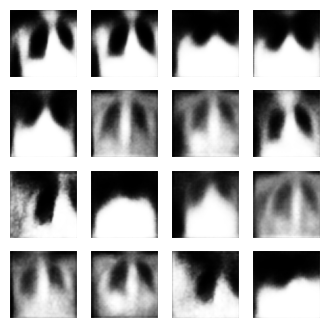

Epoch: 10, Test set ELBO: -6615.42724609375, time elapse for current epoch: 10.260250806808472


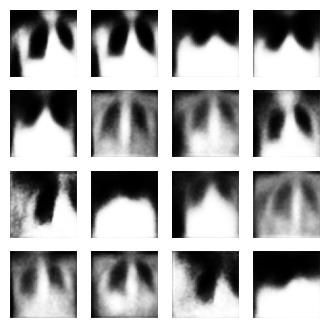

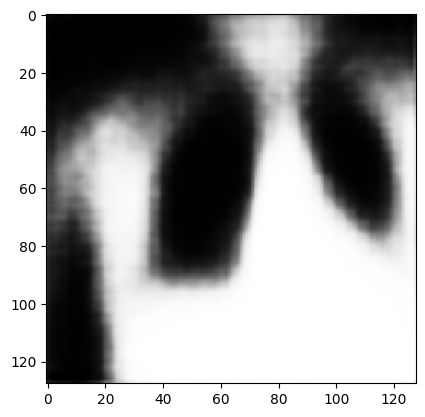

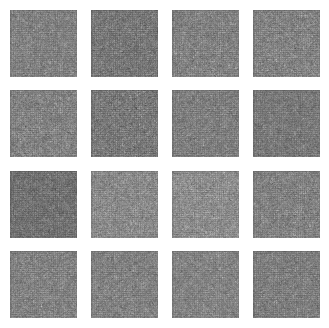

Epoch: 1, Test set ELBO: -7521.16259765625, time elapse for current epoch: 8.698583602905273


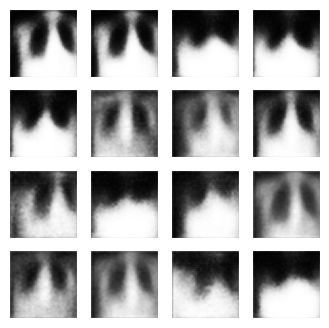

Epoch: 2, Test set ELBO: -6885.150390625, time elapse for current epoch: 6.361970663070679


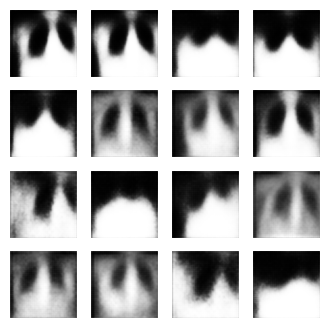

Epoch: 3, Test set ELBO: -6766.55810546875, time elapse for current epoch: 6.387364625930786


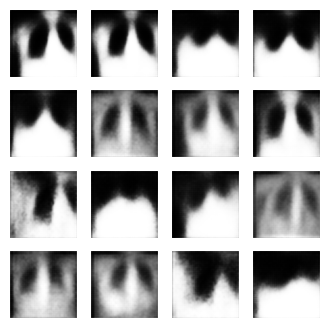

Epoch: 4, Test set ELBO: -6708.345703125, time elapse for current epoch: 6.406641483306885


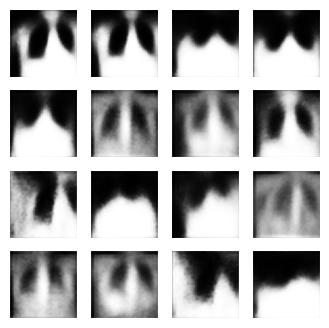

Epoch: 5, Test set ELBO: -6673.81494140625, time elapse for current epoch: 6.481362581253052


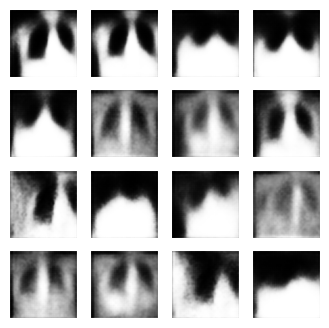

Epoch: 6, Test set ELBO: -6656.73828125, time elapse for current epoch: 6.40390944480896


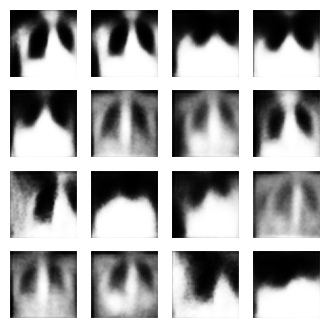

Epoch: 7, Test set ELBO: -6651.10400390625, time elapse for current epoch: 6.467128753662109


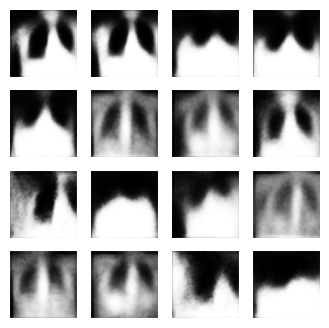

Epoch: 8, Test set ELBO: -6633.482421875, time elapse for current epoch: 6.435808420181274


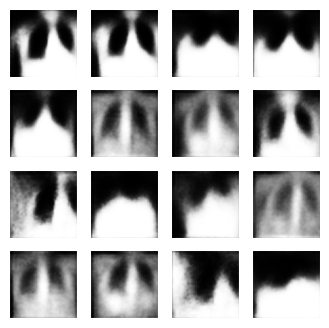

Epoch: 9, Test set ELBO: -6617.81103515625, time elapse for current epoch: 6.408656597137451


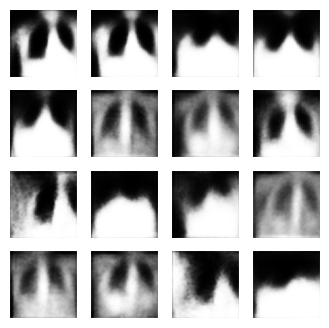

Epoch: 10, Test set ELBO: -6602.70458984375, time elapse for current epoch: 6.42793607711792


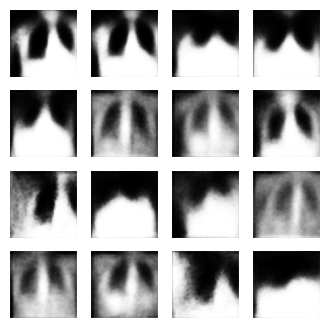

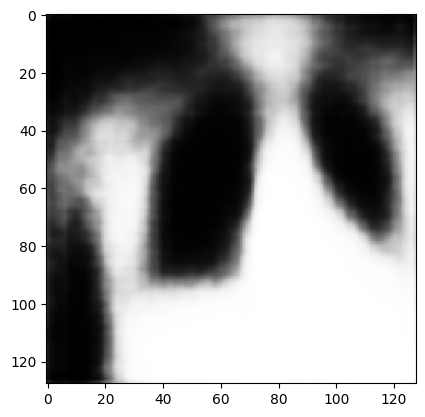

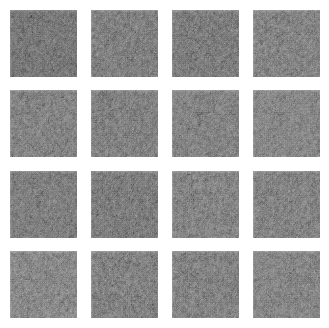

Epoch: 1, Test set ELBO: -7354.73876953125, time elapse for current epoch: 8.926895141601562


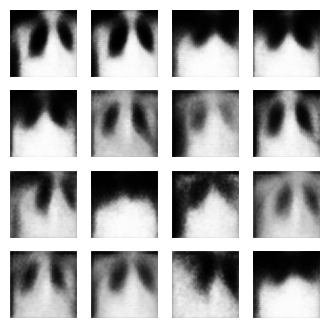

Epoch: 2, Test set ELBO: -6660.74658203125, time elapse for current epoch: 6.401910066604614


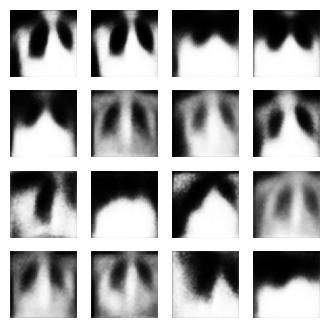

Epoch: 3, Test set ELBO: -6555.29833984375, time elapse for current epoch: 6.441900014877319


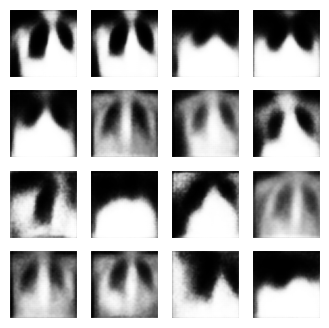

Epoch: 4, Test set ELBO: -6498.41259765625, time elapse for current epoch: 6.44879412651062


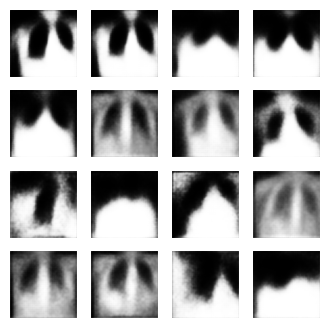

Epoch: 5, Test set ELBO: -6443.45556640625, time elapse for current epoch: 6.497442245483398


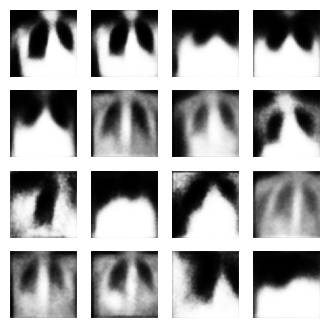

Epoch: 6, Test set ELBO: -6418.88818359375, time elapse for current epoch: 6.464662551879883


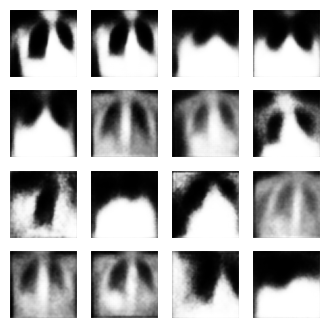

Epoch: 7, Test set ELBO: -6396.38818359375, time elapse for current epoch: 6.535342216491699


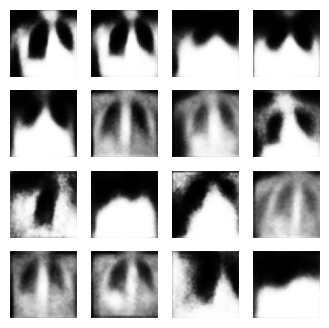

Epoch: 8, Test set ELBO: -6382.75439453125, time elapse for current epoch: 10.24578857421875


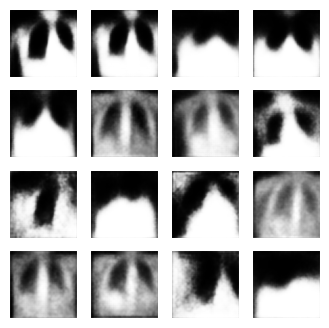

Epoch: 9, Test set ELBO: -6379.86669921875, time elapse for current epoch: 6.528581380844116


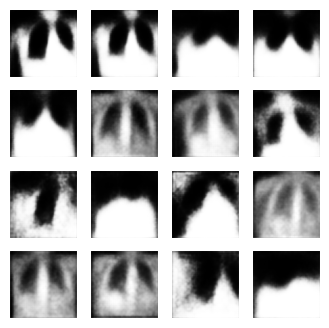

Epoch: 10, Test set ELBO: -6375.56103515625, time elapse for current epoch: 6.511778831481934


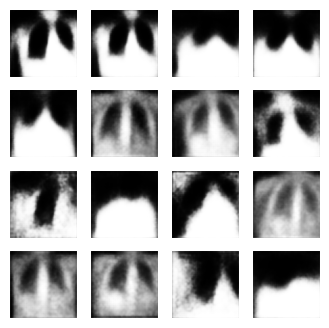

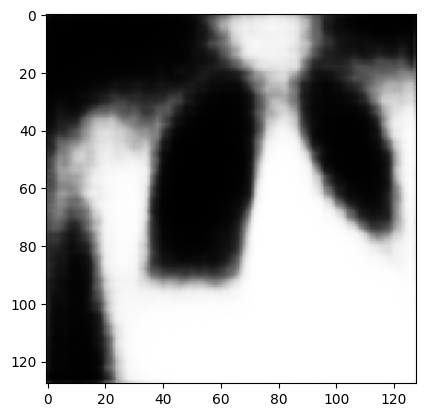

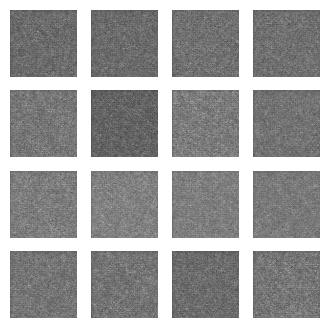

Epoch: 1, Test set ELBO: -7619.46630859375, time elapse for current epoch: 8.803400993347168


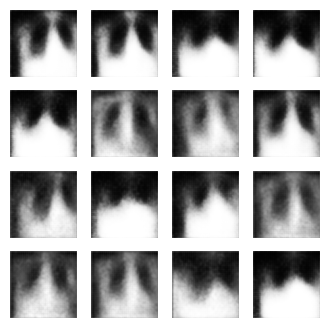

Epoch: 2, Test set ELBO: -6723.02197265625, time elapse for current epoch: 6.428547143936157


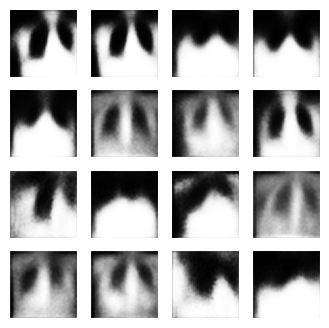

Epoch: 3, Test set ELBO: -6580.544921875, time elapse for current epoch: 6.509279489517212


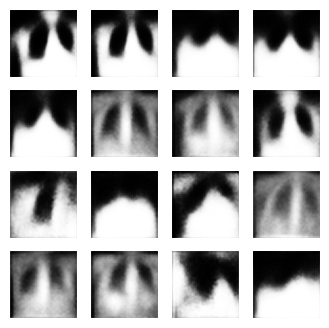

Epoch: 4, Test set ELBO: -6516.779296875, time elapse for current epoch: 10.262405633926392


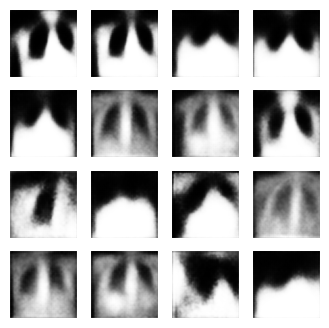

Epoch: 5, Test set ELBO: -6474.732421875, time elapse for current epoch: 6.508931875228882


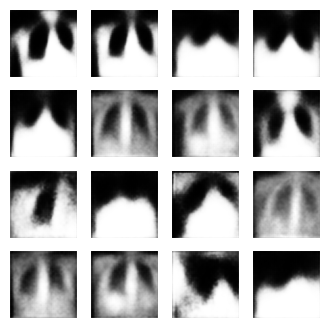

Epoch: 6, Test set ELBO: -6432.74658203125, time elapse for current epoch: 6.4779746532440186


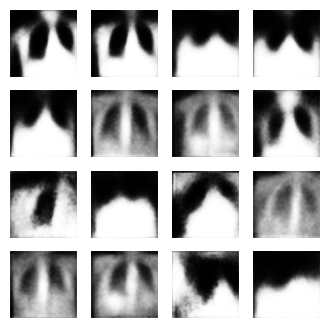

Epoch: 7, Test set ELBO: -6413.98046875, time elapse for current epoch: 10.267863988876343


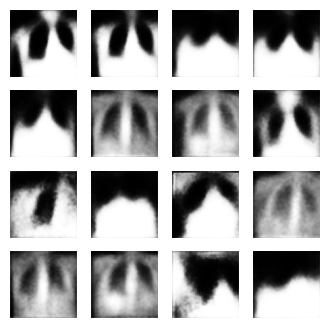

Epoch: 8, Test set ELBO: -6408.857421875, time elapse for current epoch: 6.462578296661377


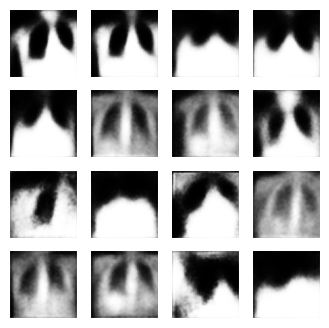

Epoch: 9, Test set ELBO: -6410.32177734375, time elapse for current epoch: 6.536551237106323


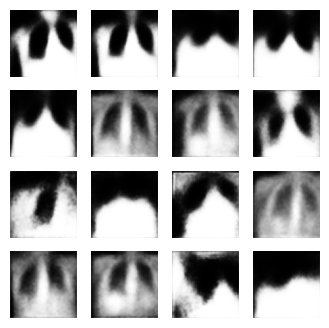

Epoch: 10, Test set ELBO: -6392.580078125, time elapse for current epoch: 10.24020791053772


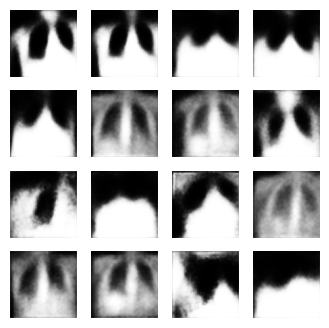

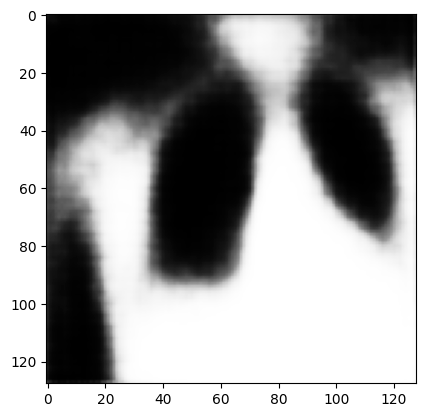

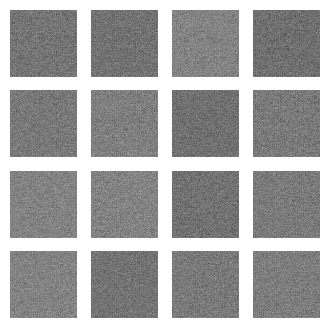

Epoch: 1, Test set ELBO: -7476.65869140625, time elapse for current epoch: 8.838721752166748


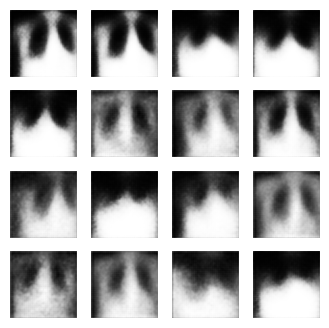

Epoch: 2, Test set ELBO: -6711.02490234375, time elapse for current epoch: 6.399421453475952


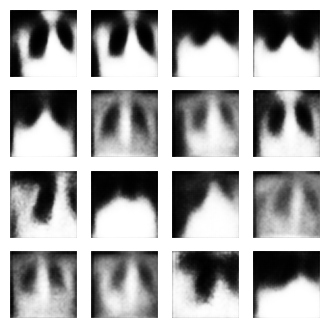

Epoch: 3, Test set ELBO: -6557.18359375, time elapse for current epoch: 6.782027006149292


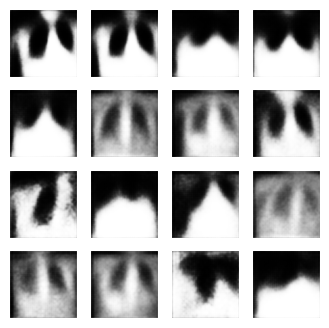

Epoch: 4, Test set ELBO: -6595.01318359375, time elapse for current epoch: 6.617817163467407


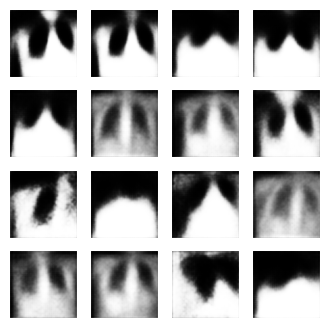

Epoch: 5, Test set ELBO: -6443.859375, time elapse for current epoch: 10.254436731338501


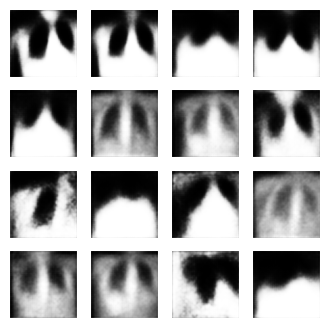

Epoch: 6, Test set ELBO: -6405.55322265625, time elapse for current epoch: 6.7991249561309814


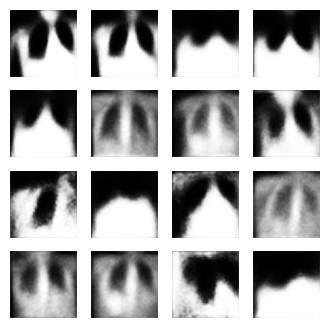

Epoch: 7, Test set ELBO: -6384.220703125, time elapse for current epoch: 6.663965463638306


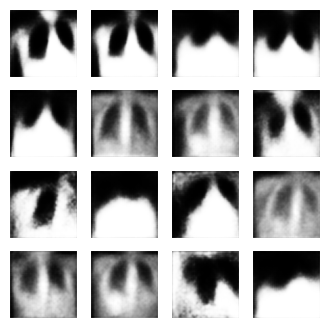

Epoch: 8, Test set ELBO: -6364.548828125, time elapse for current epoch: 6.569199800491333


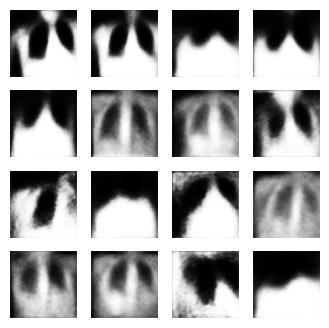

Epoch: 9, Test set ELBO: -6355.21875, time elapse for current epoch: 6.545637369155884


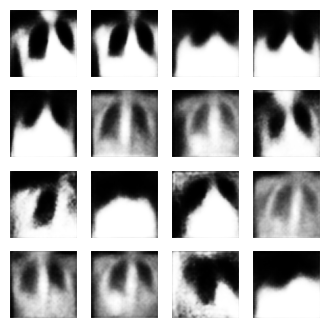

Epoch: 10, Test set ELBO: -6371.85009765625, time elapse for current epoch: 6.48237943649292


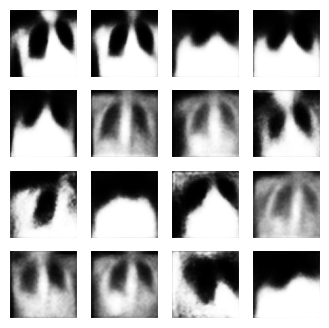

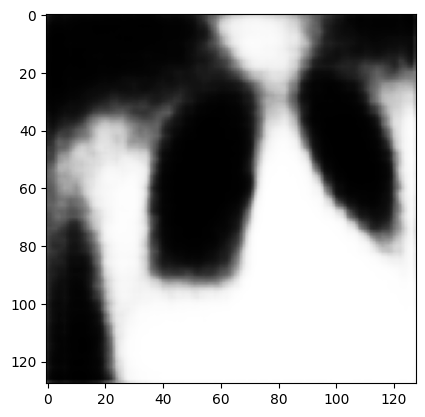

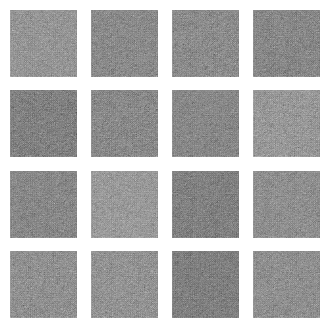

Epoch: 1, Test set ELBO: -7312.95849609375, time elapse for current epoch: 10.281663179397583


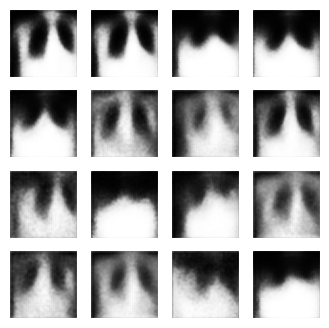

Epoch: 2, Test set ELBO: -6640.71728515625, time elapse for current epoch: 6.5851969718933105


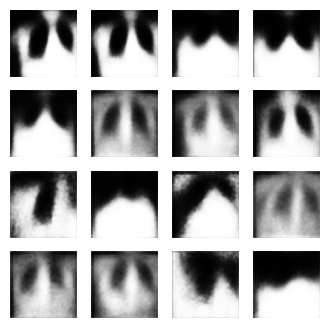

Epoch: 3, Test set ELBO: -6542.17138671875, time elapse for current epoch: 6.537897109985352


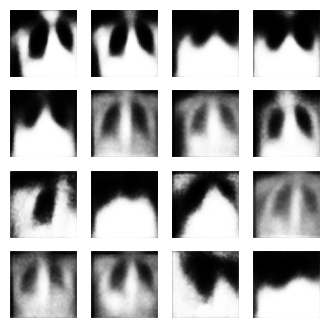

Epoch: 4, Test set ELBO: -6457.046875, time elapse for current epoch: 6.444575071334839


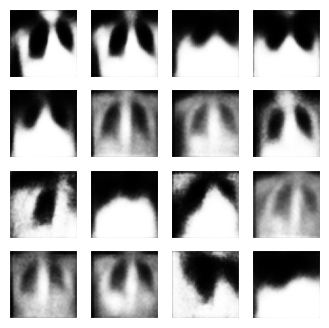

Epoch: 5, Test set ELBO: -6418.30224609375, time elapse for current epoch: 6.548570156097412


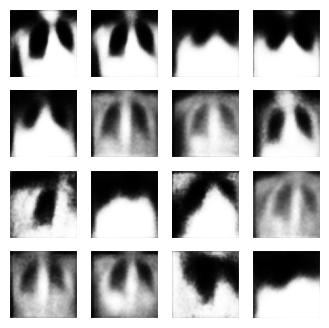

Epoch: 6, Test set ELBO: -6394.06396484375, time elapse for current epoch: 6.4783570766448975


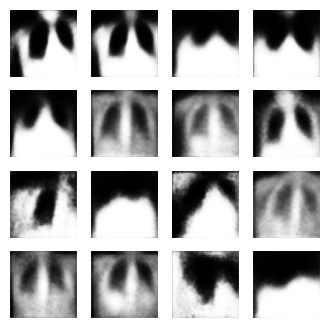

Epoch: 7, Test set ELBO: -6373.90380859375, time elapse for current epoch: 10.27028751373291


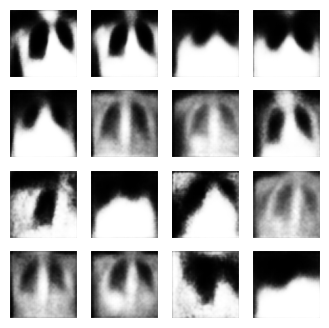

Epoch: 8, Test set ELBO: -6363.76416015625, time elapse for current epoch: 6.499671697616577


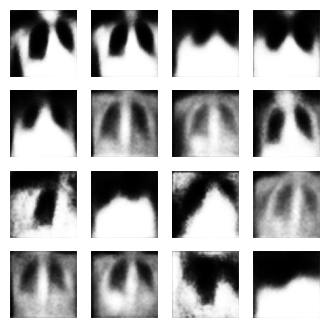

Epoch: 9, Test set ELBO: -6352.43701171875, time elapse for current epoch: 6.440590858459473


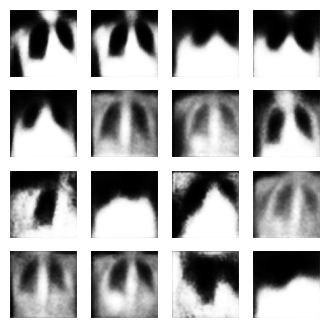

Epoch: 10, Test set ELBO: -6378.84765625, time elapse for current epoch: 10.269810914993286


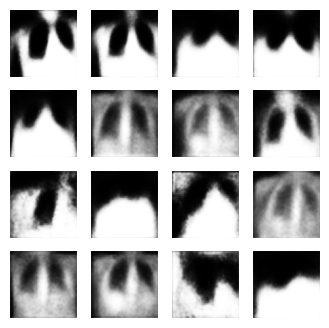

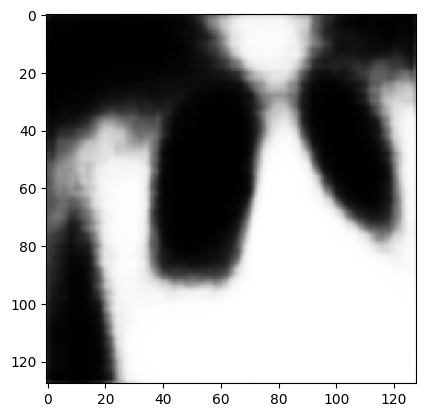

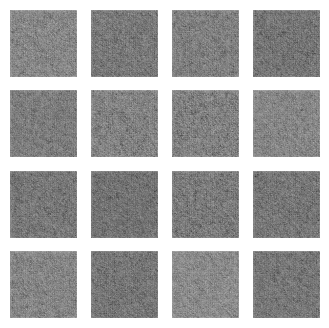

Epoch: 1, Test set ELBO: -7420.24658203125, time elapse for current epoch: 9.523728609085083


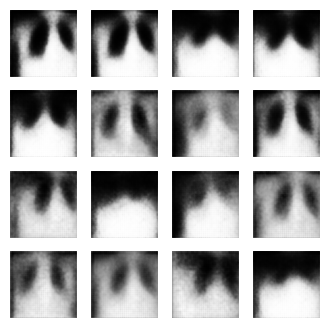

Epoch: 2, Test set ELBO: -6642.12646484375, time elapse for current epoch: 6.408155918121338


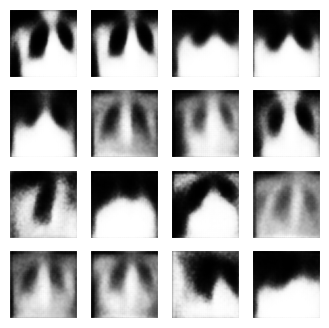

Epoch: 3, Test set ELBO: -6545.24951171875, time elapse for current epoch: 6.464758634567261


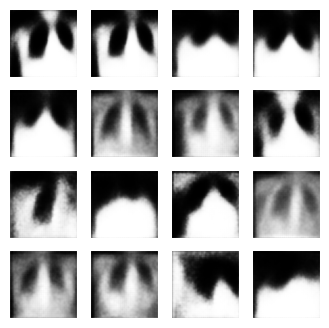

Epoch: 4, Test set ELBO: -6497.49365234375, time elapse for current epoch: 10.270074844360352


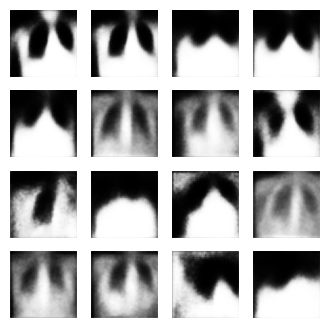

Epoch: 5, Test set ELBO: -6430.85888671875, time elapse for current epoch: 10.262040376663208


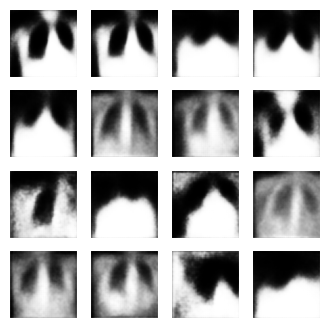

Epoch: 6, Test set ELBO: -6419.05322265625, time elapse for current epoch: 6.475163221359253


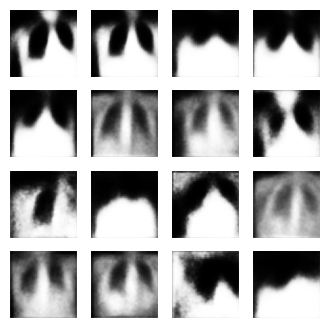

Epoch: 7, Test set ELBO: -6379.92578125, time elapse for current epoch: 6.533231496810913


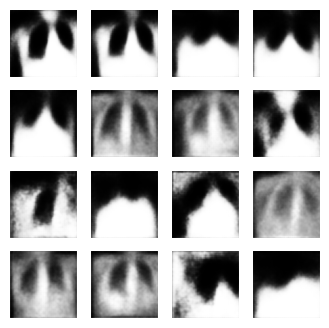

Epoch: 8, Test set ELBO: -6362.72119140625, time elapse for current epoch: 6.460567951202393


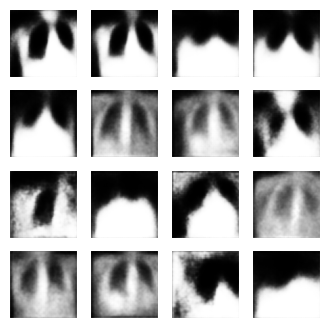

Epoch: 9, Test set ELBO: -6355.64697265625, time elapse for current epoch: 6.509717702865601


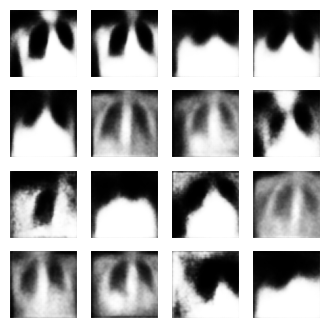

Epoch: 10, Test set ELBO: -6359.10595703125, time elapse for current epoch: 6.4584901332855225


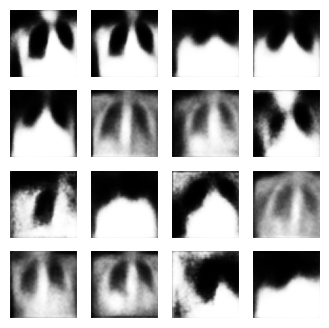

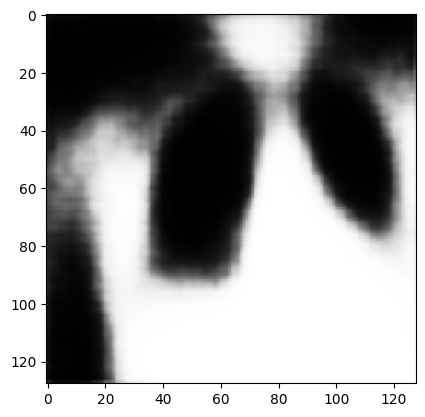

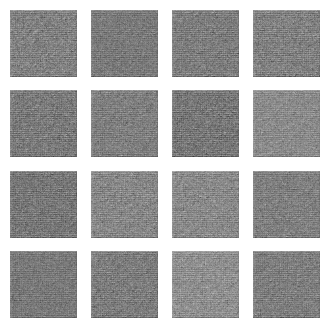

Epoch: 1, Test set ELBO: -7380.21435546875, time elapse for current epoch: 9.34122610092163


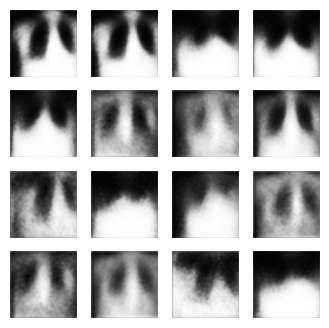

Epoch: 2, Test set ELBO: -6582.60400390625, time elapse for current epoch: 6.482034683227539


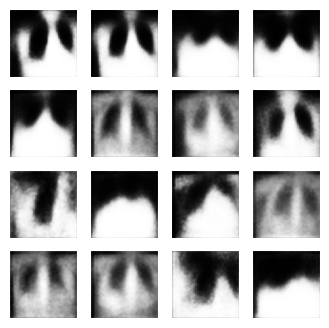

Epoch: 3, Test set ELBO: -6387.6875, time elapse for current epoch: 6.660038232803345


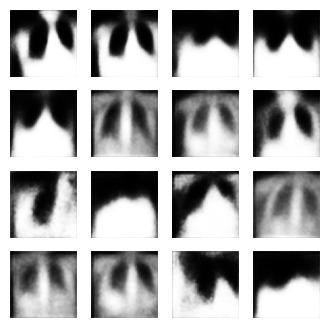

Epoch: 4, Test set ELBO: -6326.91650390625, time elapse for current epoch: 6.493564605712891


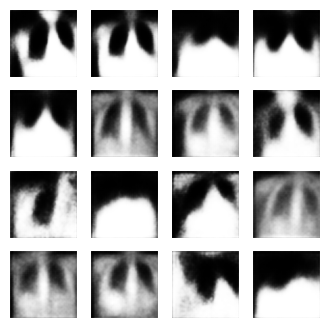

Epoch: 5, Test set ELBO: -6276.98681640625, time elapse for current epoch: 6.495336532592773


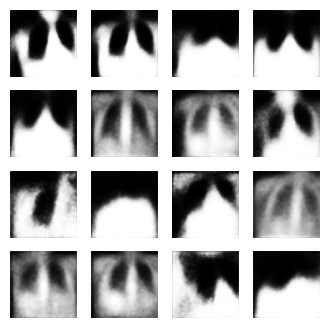

Epoch: 6, Test set ELBO: -6227.24072265625, time elapse for current epoch: 6.52616286277771


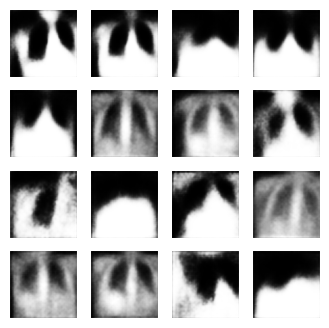

Epoch: 7, Test set ELBO: -6210.669921875, time elapse for current epoch: 6.6156837940216064


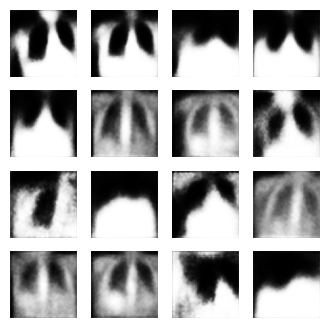

Epoch: 8, Test set ELBO: -6191.578125, time elapse for current epoch: 10.27374267578125


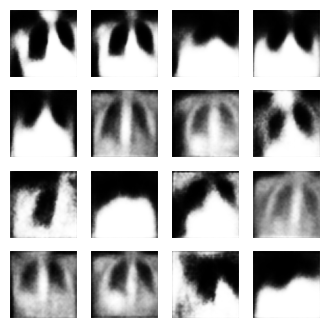

Epoch: 9, Test set ELBO: -6193.67333984375, time elapse for current epoch: 6.56113076210022


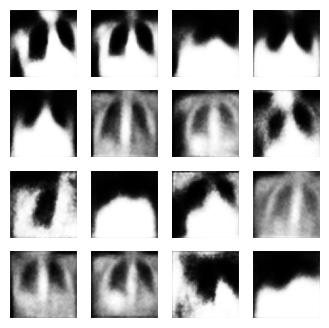

Epoch: 10, Test set ELBO: -6175.30908203125, time elapse for current epoch: 6.573543071746826


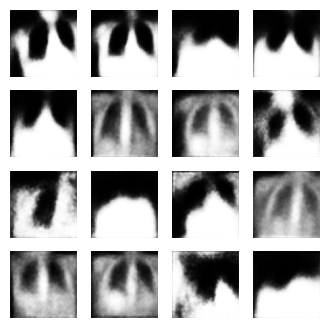

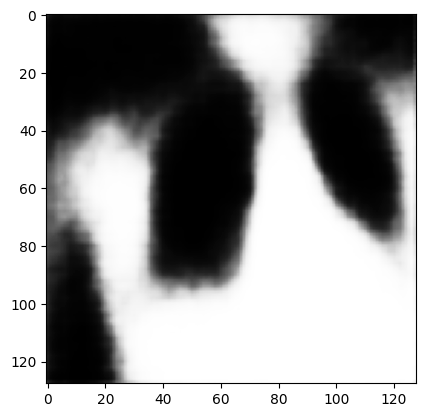

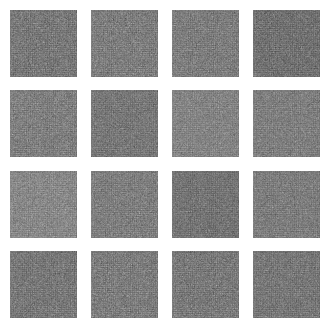

Epoch: 1, Test set ELBO: -7362.63427734375, time elapse for current epoch: 8.94392466545105


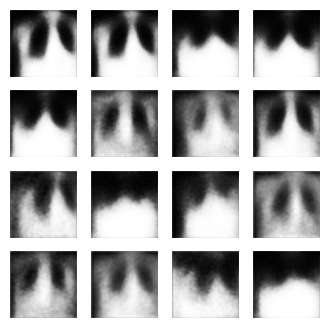

Epoch: 2, Test set ELBO: -6590.61376953125, time elapse for current epoch: 6.49443793296814


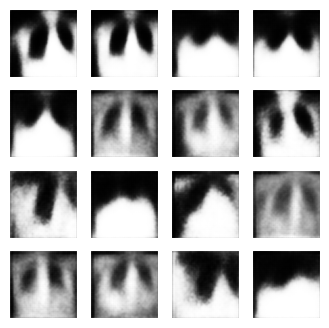

Epoch: 3, Test set ELBO: -6379.84228515625, time elapse for current epoch: 6.53292989730835


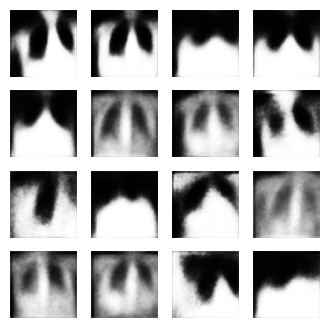

Epoch: 4, Test set ELBO: -6396.14111328125, time elapse for current epoch: 6.508650302886963


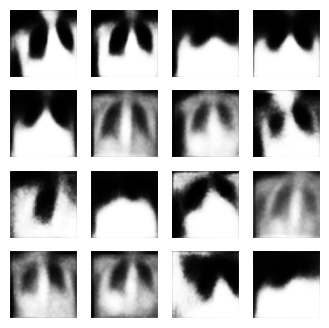

Epoch: 5, Test set ELBO: -6261.56787109375, time elapse for current epoch: 6.516611576080322


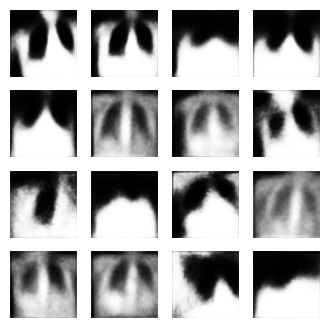

Epoch: 6, Test set ELBO: -6231.66748046875, time elapse for current epoch: 6.553396224975586


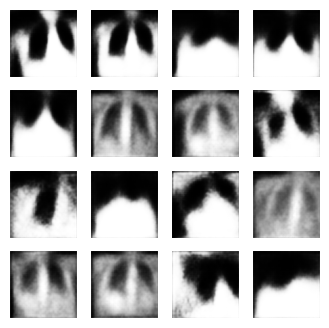

Epoch: 7, Test set ELBO: -6209.51318359375, time elapse for current epoch: 6.537598371505737


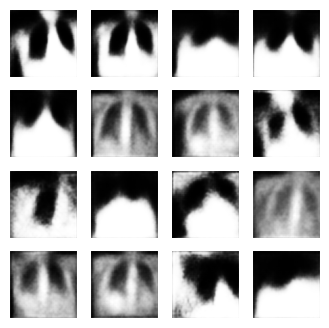

Epoch: 8, Test set ELBO: -6198.84619140625, time elapse for current epoch: 6.534695148468018


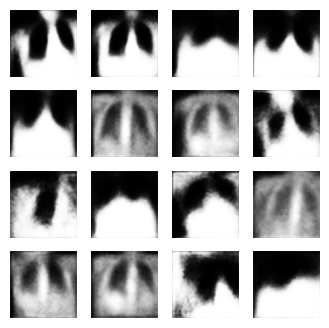

Epoch: 9, Test set ELBO: -6189.06982421875, time elapse for current epoch: 6.546513557434082


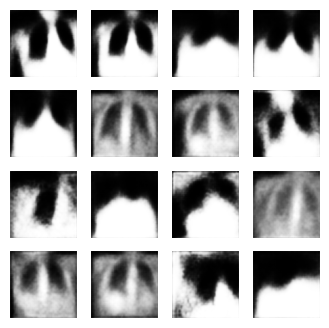

Epoch: 10, Test set ELBO: -6182.91943359375, time elapse for current epoch: 6.601415395736694


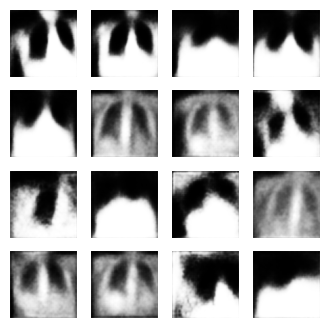

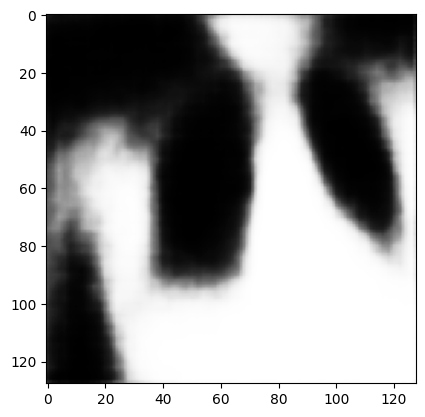

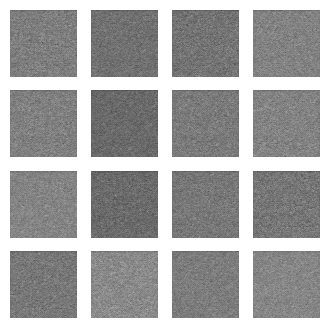

Epoch: 1, Test set ELBO: -7501.08984375, time elapse for current epoch: 8.889647960662842


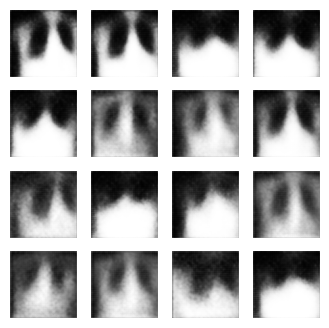

Epoch: 2, Test set ELBO: -6605.61328125, time elapse for current epoch: 6.5244574546813965


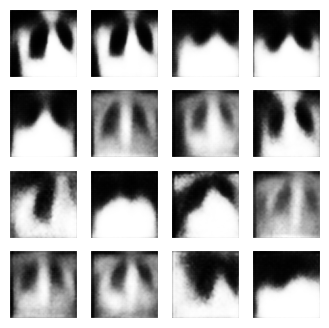

Epoch: 3, Test set ELBO: -6435.72119140625, time elapse for current epoch: 6.566946029663086


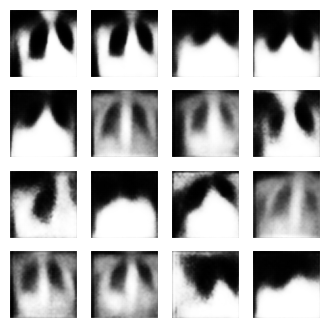

Epoch: 4, Test set ELBO: -6326.04736328125, time elapse for current epoch: 6.5383477210998535


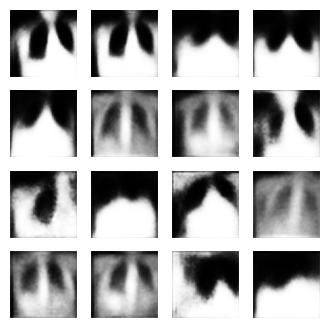

Epoch: 5, Test set ELBO: -6276.93212890625, time elapse for current epoch: 6.567086935043335


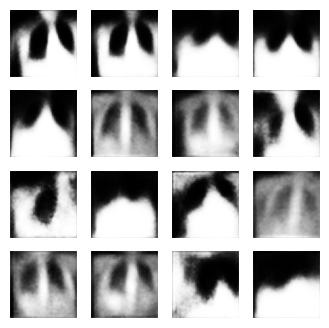

Epoch: 6, Test set ELBO: -6243.88525390625, time elapse for current epoch: 6.541059732437134


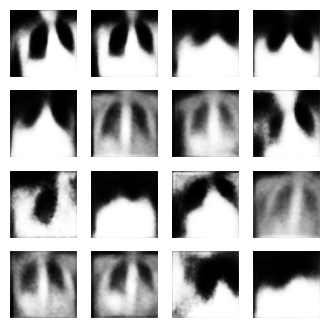

Epoch: 7, Test set ELBO: -6220.96435546875, time elapse for current epoch: 6.580187559127808


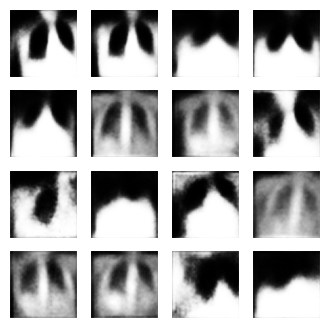

Epoch: 8, Test set ELBO: -6214.01318359375, time elapse for current epoch: 6.56547212600708


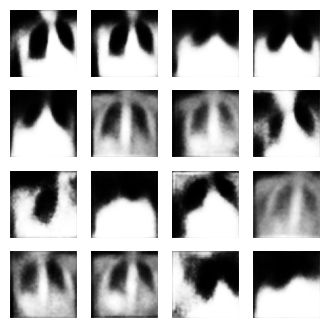

Epoch: 9, Test set ELBO: -6195.4453125, time elapse for current epoch: 6.558060646057129


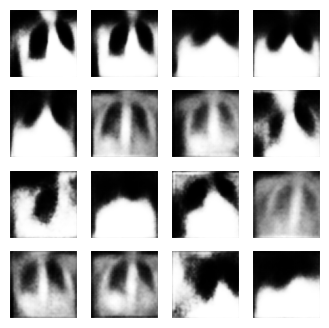

Epoch: 10, Test set ELBO: -6185.01513671875, time elapse for current epoch: 6.624756813049316


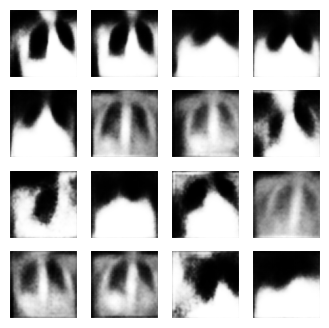

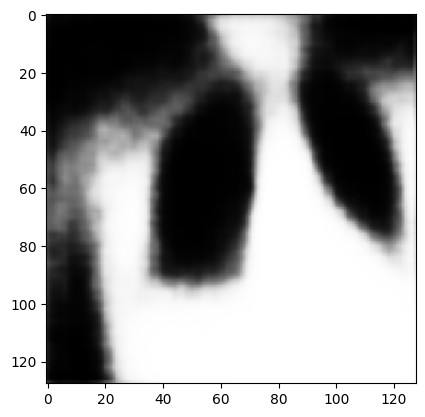

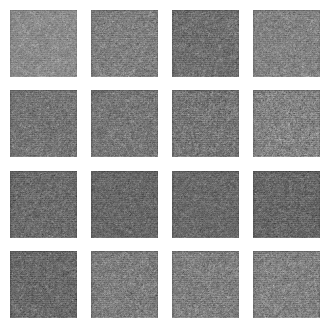

Epoch: 1, Test set ELBO: -7263.34033203125, time elapse for current epoch: 8.923369646072388


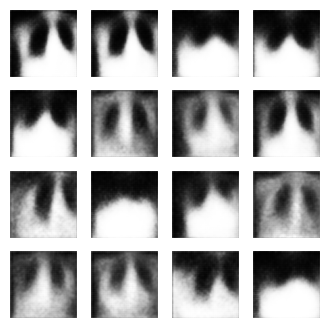

Epoch: 2, Test set ELBO: -6526.54345703125, time elapse for current epoch: 6.582505941390991


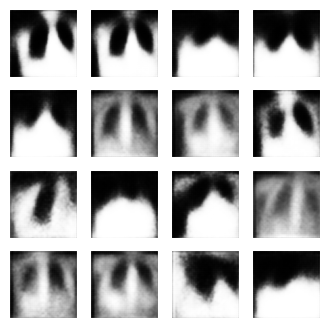

Epoch: 3, Test set ELBO: -6416.009765625, time elapse for current epoch: 6.72366738319397


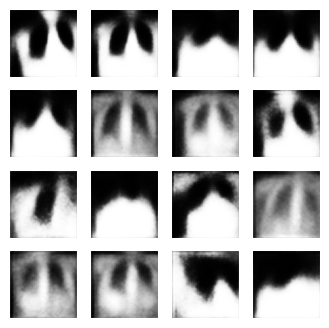

Epoch: 4, Test set ELBO: -6337.35595703125, time elapse for current epoch: 10.271705865859985


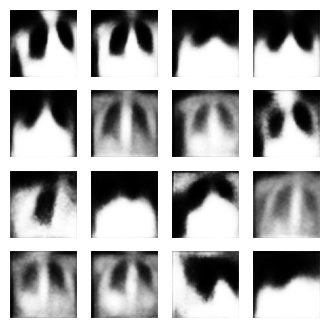

Epoch: 5, Test set ELBO: -6288.33349609375, time elapse for current epoch: 6.693640470504761


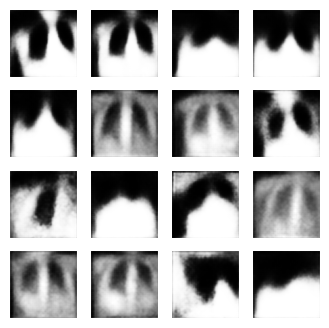

Epoch: 6, Test set ELBO: -6260.74169921875, time elapse for current epoch: 6.766302824020386


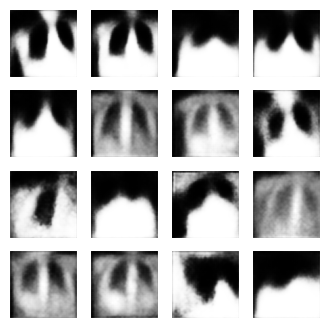

Epoch: 7, Test set ELBO: -6244.81103515625, time elapse for current epoch: 6.669734001159668


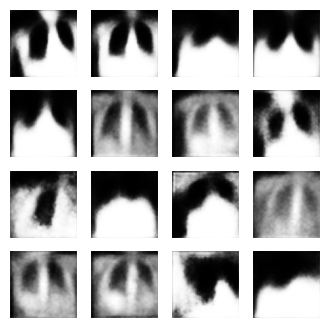

Epoch: 8, Test set ELBO: -6225.12109375, time elapse for current epoch: 6.734213590621948


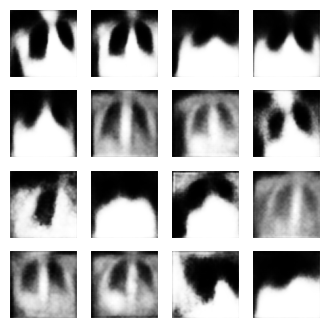

Epoch: 9, Test set ELBO: -6219.5, time elapse for current epoch: 10.266545295715332


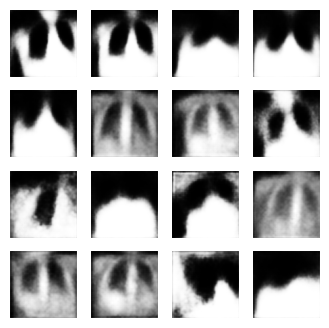

Epoch: 10, Test set ELBO: -6216.40380859375, time elapse for current epoch: 6.6561501026153564


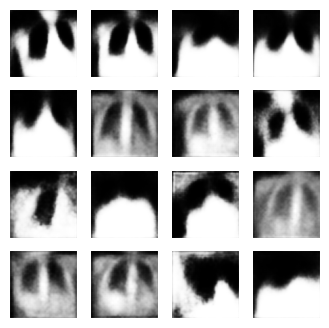

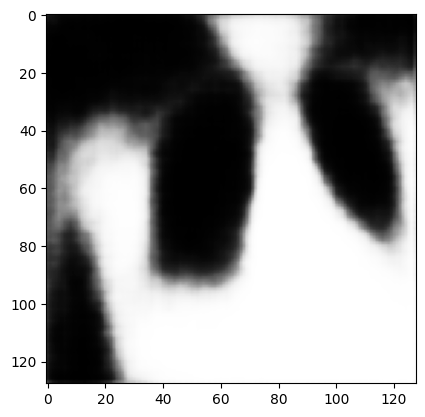

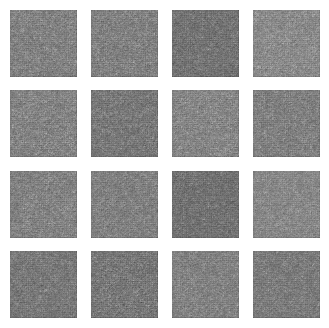

Epoch: 1, Test set ELBO: -8732.5810546875, time elapse for current epoch: 9.102599143981934


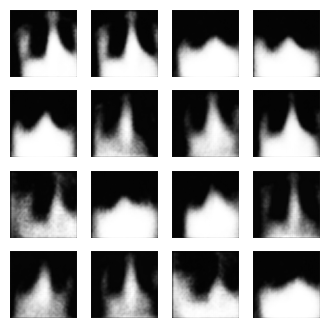

Epoch: 2, Test set ELBO: -6792.10888671875, time elapse for current epoch: 6.592658281326294


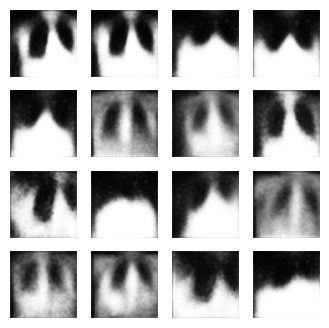

Epoch: 3, Test set ELBO: -6508.328125, time elapse for current epoch: 6.719184398651123


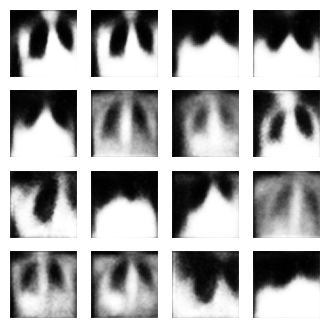

Epoch: 4, Test set ELBO: -6409.39013671875, time elapse for current epoch: 6.723137855529785


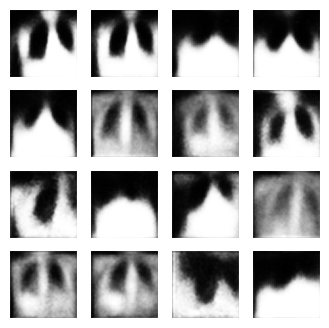

Epoch: 5, Test set ELBO: -6365.09912109375, time elapse for current epoch: 6.795982122421265


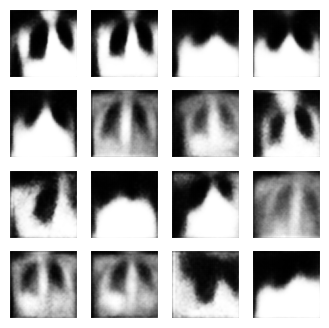

Epoch: 6, Test set ELBO: -6328.45703125, time elapse for current epoch: 6.752496004104614


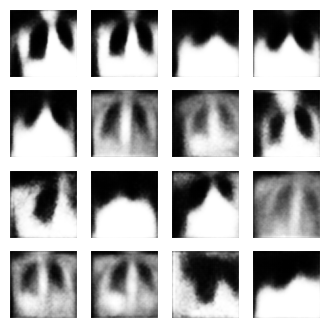

Epoch: 7, Test set ELBO: -6310.19677734375, time elapse for current epoch: 6.842348337173462


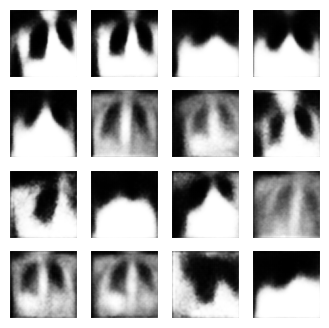

Epoch: 8, Test set ELBO: -6303.83740234375, time elapse for current epoch: 10.273082971572876


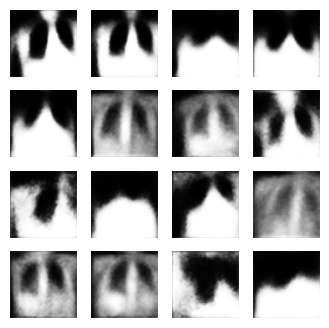

Epoch: 9, Test set ELBO: -6298.59521484375, time elapse for current epoch: 6.702739238739014


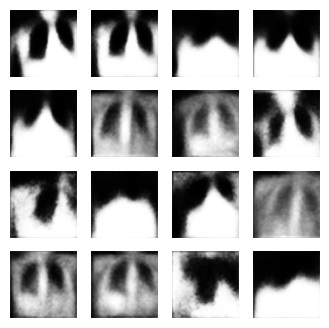

Epoch: 10, Test set ELBO: -6278.34912109375, time elapse for current epoch: 6.82024359703064


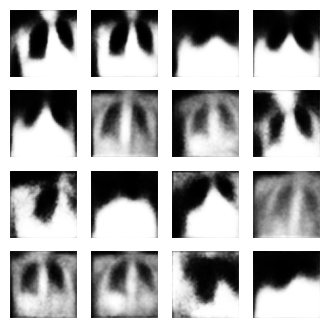

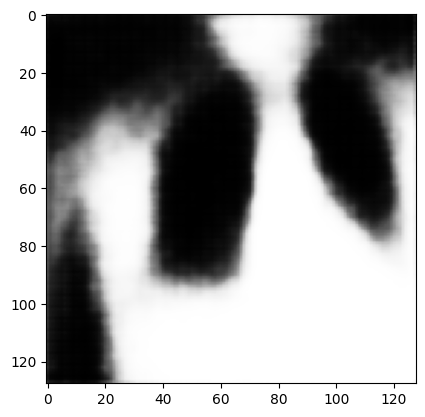

In [ ]:


for latentVar in [2,4,6,8,10]:
  numKfold = 5
  epochs = 10
  latent_dim = latentVar
  num_examples_to_generate = 16
  batchSize = 31
  totalError = np.empty(shape=(numKfold,batchSize-1))
  for kFold in range(numKfold):
    #________MODEL___________
    class CVAE(tf.keras.Model):
      """Convolutional variational autoencoder."""

      def __init__(self, latent_dim):
        super(CVAE, self).__init__()
        self.latent_dim = latent_dim
        self.encoder = tf.keras.Sequential(
            [
                tf.keras.layers.InputLayer(input_shape=(128, 128, 1)),
                tf.keras.layers.Conv2D(
                    filters=32, kernel_size=3, strides=(2, 2), activation='relu'),
                tf.keras.layers.Conv2D(
                    filters=64, kernel_size=3, strides=(2, 2), activation='relu'),
                tf.keras.layers.Flatten(),
                # No activation
                tf.keras.layers.Dense(latent_dim + latent_dim),
            ]
        )

        self.decoder = tf.keras.Sequential(
            [
                tf.keras.layers.InputLayer(input_shape=(latent_dim,)),
                tf.keras.layers.Dense(units=32*32*32, activation=tf.nn.relu),
                tf.keras.layers.Reshape(target_shape=(32, 32, 32)),
                tf.keras.layers.Conv2DTranspose(
                    filters=64, kernel_size=3, strides=2, padding='same',
                    activation='relu'),
                tf.keras.layers.Conv2DTranspose(
                    filters=32, kernel_size=3, strides=2, padding='same',
                    activation='relu'),
                # No activation
                tf.keras.layers.Conv2DTranspose(
                    filters=1, kernel_size=3, strides=1, padding='same'),
            ]
        )

      @tf.function
      def sample(self, eps=None):
        if eps is None:
          eps = tf.random.normal(shape=(100, self.latent_dim))
        return self.decode(eps, apply_sigmoid=True)

      def encode(self, x):
        mean, logvar = tf.split(self.encoder(x), num_or_size_splits=2, axis=1)
        return mean, logvar

      def reparameterize(self, mean, logvar):
        eps = tf.random.normal(shape=mean.shape)
        return eps * tf.exp(logvar * .5) + mean

      def decode(self, z, apply_sigmoid=False):
        logits = self.decoder(z)
        if apply_sigmoid:
          probs = tf.sigmoid(logits)
          return probs
        return logits

    optimizer = tf.keras.optimizers.Adam(1e-4)


    def log_normal_pdf(sample, mean, logvar, raxis=1):
      log2pi = tf.math.log(2. * np.pi)
      return tf.reduce_sum(
          -.5 * ((sample - mean) ** 2. * tf.exp(-logvar) + logvar + log2pi),
          axis=raxis)


    def compute_loss(model, x):
      mean, logvar = model.encode(x)
      z = model.reparameterize(mean, logvar)
      x_logit = model.decode(z)
      cross_ent = tf.nn.sigmoid_cross_entropy_with_logits(logits=x_logit, labels=x)
      logpx_z = -tf.reduce_sum(cross_ent, axis=[1, 2, 3])
      logpz = log_normal_pdf(z, 0., 0.)
      logqz_x = log_normal_pdf(z, mean, logvar)
      return -tf.reduce_mean(logpx_z + logpz - logqz_x)


    @tf.function
    def train_step(model, x, optimizer):
      """Executes one training step and returns the loss.

      This function computes the loss and gradients, and uses the latter to
      update the model's parameters.
      """
      with tf.GradientTape() as tape:
        loss = compute_loss(model, x)
      gradients = tape.gradient(loss, model.trainable_variables)
      optimizer.apply_gradients(zip(gradients, model.trainable_variables))

    random_vector_for_generation = tf.random.normal(
      shape=[num_examples_to_generate, latent_dim])
    model = CVAE(latent_dim)

    assert batch_size >= num_examples_to_generate
    for test_batch in test_dataset.take(1):
      test_sample = test_batch[0:num_examples_to_generate, :, :, :]
    #_______________

    generate_and_save_images(model, 0, test_sample)

    for epoch in range(1, epochs + 1):
      start_time = time.time()
      for train_x in train_dataset:
        train_step(model, train_x, optimizer)
      end_time = time.time()

      loss = tf.keras.metrics.Mean()
      for test_x in test_dataset:
        loss(compute_loss(model, test_x))
      elbo = -loss.result()
      #display.clear_output(wait=False)
      print('Epoch: {}, Test set ELBO: {}, time elapse for current epoch: {}'
            .format(epoch, elbo, end_time - start_time))
      generate_and_save_images(model, epoch, test_sample)

    OrigionalImages = np.empty(shape=(batchSize, 128,128))
    VAEGeneratedImages = np.empty(shape=(batchSize, 128,128))

    for imageNum in range(batchSize):
      #For recreating images from testing set to compare to VAE produced
      test_image = test_batch[imageNum, :, :,:].numpy()
      normalized_image = (test_image-np.min(test_image))/(np.max(test_image)-np.min(test_image))
      OrigionalImages[imageNum] = test_image.reshape((128, 128))
      #For producing images that have been encoded and decoded by the VAE
      VAEAlteredImage = test_batch[imageNum:imageNum+1, :, :,:].numpy()
      mean, logvar = model.encode(VAEAlteredImage)
      z = model.reparameterize(mean, logvar)
      predictions = model.sample(z)
      VAEGeneratedImages[imageNum] = tf.reshape(predictions[0], (128, 128))

    plt.imshow(OrigionalImages[0],cmap='Greys_r')
    plt.imshow( VAEGeneratedImages[0],cmap='Greys_r')

    #For directly comparing the error between the origional and produce dimages
    for imageNum in range(batchSize -1 ):
      for col in range(128):
        for row in range(128):
          totalError[kFold, imageNum] += abs(OrigionalImages[imageNum][col,row] - VAEGeneratedImages[imageNum][col,row])
  np.save("/content/drive/MyDrive/AllDICOM/Model" + str(latentVar), totalError)




These are examples of the created error data sets created from the above experimental runs.

(array([1., 4., 1., 1., 0., 1., 0., 1., 0., 2., 0., 2., 1., 1., 0., 0., 0.,
        0., 0., 0., 1., 1., 1., 1., 3., 2., 1., 1., 1., 3.]),
 array([1948.46911452, 2126.91914068, 2305.36916684, 2483.819193  ,
        2662.26921916, 2840.71924532, 3019.16927148, 3197.61929764,
        3376.0693238 , 3554.51934996, 3732.96937612, 3911.41940228,
        4089.86942844, 4268.3194546 , 4446.76948076, 4625.21950692,
        4803.66953308, 4982.11955924, 5160.5695854 , 5339.01961156,
        5517.46963772, 5695.91966388, 5874.36969004, 6052.8197162 ,
        6231.26974236, 6409.71976852, 6588.16979468, 6766.61982084,
        6945.069847  , 7123.51987316, 7301.96989932]),
 <BarContainer object of 30 artists>)

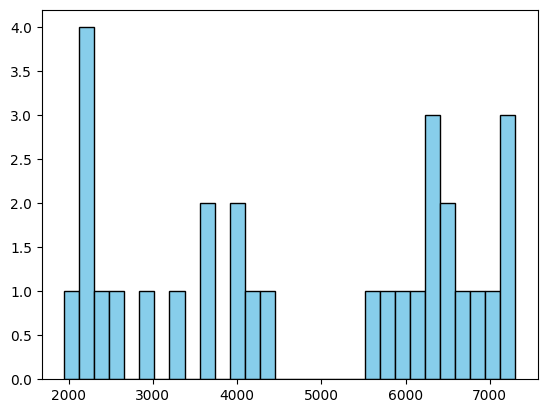

In [ ]:
totalError = np.load("/content/drive/MyDrive/AllDICOM/Model2.npy")
plt.hist(totalError[0], bins=30, color='skyblue', edgecolor='black')

(array([1., 3., 2., 0., 1., 1., 0., 1., 0., 0., 2., 2., 0., 1., 1., 0., 0.,
        0., 0., 1., 0., 1., 1., 0., 3., 2., 1., 2., 1., 3.]),
 array([1868.16304476, 2046.79308054, 2225.42311632, 2404.0531521 ,
        2582.68318788, 2761.31322366, 2939.94325944, 3118.57329522,
        3297.203331  , 3475.83336678, 3654.46340256, 3833.09343835,
        4011.72347413, 4190.35350991, 4368.98354569, 4547.61358147,
        4726.24361725, 4904.87365303, 5083.50368881, 5262.13372459,
        5440.76376037, 5619.39379616, 5798.02383194, 5976.65386772,
        6155.2839035 , 6333.91393928, 6512.54397506, 6691.17401084,
        6869.80404662, 7048.4340824 , 7227.06411818]),
 <BarContainer object of 30 artists>)

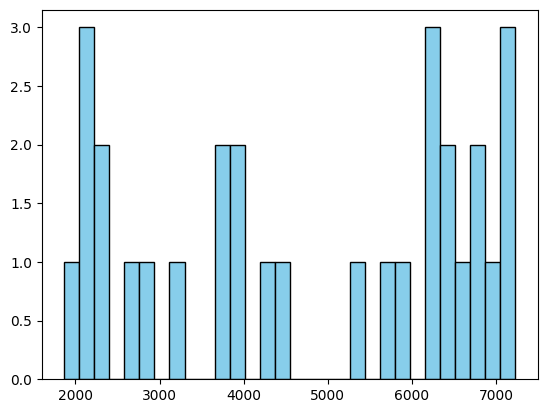

In [ ]:
totalError = np.load("/content/drive/MyDrive/AllDICOM/Model2.npy")
plt.hist(totalError[3], bins=30, color='skyblue', edgecolor='black')